# DonorsChoose

<p>
DonorsChoose.org receives hundreds of thousands of project proposals each year for classroom projects in need of funding. Right now, a large number of volunteers is needed to manually screen each submission before it's approved to be posted on the DonorsChoose.org website.
</p>
<p>
    Next year, DonorsChoose.org expects to receive close to 500,000 project proposals. As a result, there are three main problems they need to solve:
<ul>
<li>
    How to scale current manual processes and resources to screen 500,000 projects so that they can be posted as quickly and as efficiently as possible</li>
    <li>How to increase the consistency of project vetting across different volunteers to improve the experience for teachers</li>
    <li>How to focus volunteer time on the applications that need the most assistance</li>
    </ul>
</p>    
<p>
The goal of the competition is to predict whether or not a DonorsChoose.org project proposal submitted by a teacher will be approved, using the text of project descriptions as well as additional metadata about the project, teacher, and school. DonorsChoose.org can then use this information to identify projects most likely to need further review before approval.
</p>

## About the DonorsChoose Data Set

The `train.csv` data set provided by DonorsChoose contains the following features:

Feature | Description 
----------|---------------
**`project_id`** | A unique identifier for the proposed project. **Example:** `p036502`   
**`project_title`**    | Title of the project. **Examples:**<br><ul><li><code>Art Will Make You Happy!</code></li><li><code>First Grade Fun</code></li></ul> 
**`project_grade_category`** | Grade level of students for which the project is targeted. One of the following enumerated values: <br/><ul><li><code>Grades PreK-2</code></li><li><code>Grades 3-5</code></li><li><code>Grades 6-8</code></li><li><code>Grades 9-12</code></li></ul>  
 **`project_subject_categories`** | One or more (comma-separated) subject categories for the project from the following enumerated list of values:  <br/><ul><li><code>Applied Learning</code></li><li><code>Care &amp; Hunger</code></li><li><code>Health &amp; Sports</code></li><li><code>History &amp; Civics</code></li><li><code>Literacy &amp; Language</code></li><li><code>Math &amp; Science</code></li><li><code>Music &amp; The Arts</code></li><li><code>Special Needs</code></li><li><code>Warmth</code></li></ul><br/> **Examples:** <br/><ul><li><code>Music &amp; The Arts</code></li><li><code>Literacy &amp; Language, Math &amp; Science</code></li>  
  **`school_state`** | State where school is located ([Two-letter U.S. postal code](https://en.wikipedia.org/wiki/List_of_U.S._state_abbreviations#Postal_codes)). **Example:** `WY`
**`project_subject_subcategories`** | One or more (comma-separated) subject subcategories for the project. **Examples:** <br/><ul><li><code>Literacy</code></li><li><code>Literature &amp; Writing, Social Sciences</code></li></ul> 
**`project_resource_summary`** | An explanation of the resources needed for the project. **Example:** <br/><ul><li><code>My students need hands on literacy materials to manage sensory needs!</code</li></ul> 
**`project_essay_1`**    | First application essay<sup>*</sup>  
**`project_essay_2`**    | Second application essay<sup>*</sup> 
**`project_essay_3`**    | Third application essay<sup>*</sup> 
**`project_essay_4`**    | Fourth application essay<sup>*</sup> 
**`project_submitted_datetime`** | Datetime when project application was submitted. **Example:** `2016-04-28 12:43:56.245`   
**`teacher_id`** | A unique identifier for the teacher of the proposed project. **Example:** `bdf8baa8fedef6bfeec7ae4ff1c15c56`  
**`teacher_prefix`** | Teacher's title. One of the following enumerated values: <br/><ul><li><code>nan</code></li><li><code>Dr.</code></li><li><code>Mr.</code></li><li><code>Mrs.</code></li><li><code>Ms.</code></li><li><code>Teacher.</code></li></ul>  
**`teacher_number_of_previously_posted_projects`** | Number of project applications previously submitted by the same teacher. **Example:** `2` 

<sup>*</sup> See the section <b>Notes on the Essay Data</b> for more details about these features.

Additionally, the `resources.csv` data set provides more data about the resources required for each project. Each line in this file represents a resource required by a project:

Feature | Description 
----------|---------------
**`id`** | A `project_id` value from the `train.csv` file.  **Example:** `p036502`   
**`description`** | Desciption of the resource. **Example:** `Tenor Saxophone Reeds, Box of 25`   
**`quantity`** | Quantity of the resource required. **Example:** `3`   
**`price`** | Price of the resource required. **Example:** `9.95`   

**Note:** Many projects require multiple resources. The `id` value corresponds to a `project_id` in train.csv, so you use it as a key to retrieve all resources needed for a project:

The data set contains the following label (the value you will attempt to predict):

Label | Description
----------|---------------
`project_is_approved` | A binary flag indicating whether DonorsChoose approved the project. A value of `0` indicates the project was not approved, and a value of `1` indicates the project was approved.

### Notes on the Essay Data

<ul>
Prior to May 17, 2016, the prompts for the essays were as follows:
<li>__project_essay_1:__ "Introduce us to your classroom"</li>
<li>__project_essay_2:__ "Tell us more about your students"</li>
<li>__project_essay_3:__ "Describe how your students will use the materials you're requesting"</li>
<li>__project_essay_3:__ "Close by sharing why your project will make a difference"</li>
</ul>


<ul>
Starting on May 17, 2016, the number of essays was reduced from 4 to 2, and the prompts for the first 2 essays were changed to the following:<br>
<li>__project_essay_1:__ "Describe your students: What makes your students special? Specific details about their background, your neighborhood, and your school are all helpful."</li>
<li>__project_essay_2:__ "About your project: How will these materials make a difference in your students' learning and improve their school lives?"</li>
<br>For all projects with project_submitted_datetime of 2016-05-17 and later, the values of project_essay_3 and project_essay_4 will be NaN.
</ul>


In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

from plotly import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

## 1.1 Reading Data

In [2]:
project_data = pd.read_csv('train_data.csv')
resource_data = pd.read_csv('resources.csv')

In [3]:
print("Number of data points in train data", project_data.shape)
print('-'*50)
print("The attributes of data :", project_data.columns.values)

Number of data points in train data (109248, 17)
--------------------------------------------------
The attributes of data : ['Unnamed: 0' 'id' 'teacher_id' 'teacher_prefix' 'school_state'
 'project_submitted_datetime' 'project_grade_category'
 'project_subject_categories' 'project_subject_subcategories'
 'project_title' 'project_essay_1' 'project_essay_2' 'project_essay_3'
 'project_essay_4' 'project_resource_summary'
 'teacher_number_of_previously_posted_projects' 'project_is_approved']


In [4]:
print("Number of data points in train data", resource_data.shape)
print(resource_data.columns.values)
resource_data.head(2)

Number of data points in train data (1541272, 4)
['id' 'description' 'quantity' 'price']


,id,description,quantity,price
0,p233245,LC652 - Lakeshore Double-Space Mobile Drying Rack,1,149.00
1,p069063,Bouncy Bands for Desks (Blue support pipes),3,14.95


## 1.2 preprocessing of `project_subject_categories`

In [5]:
catogories = list(project_data['project_subject_categories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
cat_list = []
for i in catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp+=j.strip()+" " #" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_') # we are replacing the & value into 
    cat_list.append(temp.strip())
    
project_data['clean_categories'] = cat_list
project_data.drop(['project_subject_categories'], axis=1, inplace=True)

from collections import Counter
my_counter = Counter()
for word in project_data['clean_categories'].values:
    my_counter.update(word.split())

cat_dict = dict(my_counter)
sorted_cat_dict = dict(sorted(cat_dict.items(), key=lambda kv: kv[1]))


## 1.3 preprocessing of `project_subject_subcategories`

In [6]:
sub_catogories = list(project_data['project_subject_subcategories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

sub_cat_list = []
for i in sub_catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    sub_cat_list.append(temp.strip())

project_data['clean_subcategories'] = sub_cat_list
project_data.drop(['project_subject_subcategories'], axis=1, inplace=True)

# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
my_counter = Counter()
for word in project_data['clean_subcategories'].values:
    my_counter.update(word.split())
    
sub_cat_dict = dict(my_counter)
sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))

## 1.4 Text preprocessing

In [7]:
# merge two column text dataframe: 
project_data["essay"] = project_data["project_essay_1"].map(str) +\
                        project_data["project_essay_2"].map(str) + \
                        project_data["project_essay_3"].map(str) + \
                        project_data["project_essay_4"].map(str)

In [8]:
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0,Literacy_Language,ESL Literacy,My students are English learners that are work...
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,1,History_Civics Health_Sports,Civics_Government TeamSports,Our students arrive to our school eager to lea...


In [9]:
#### 1.4.2.3 Using Pretrained Models: TFIDF weighted W2V

In [10]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [11]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

In [12]:
# Combining all the above stundents 
from tqdm import tqdm
preprocessed_essays = []
# tqdm is for printing the status bar
for sentance in tqdm(project_data['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e not in stopwords)
    preprocessed_essays.append(sent.lower().strip())

100%|██████████| 109248/109248 [01:12<00:00, 1516.67it/s]


In [13]:
# Combining all the preprocessing steps.
def preprocess_text_col(text_col):
    
    from tqdm import tqdm_notebook
    preprocessed_essays = []
    
    # tqdm is for printing the status bar
    for sentence in tqdm_notebook(text_col.values):
        sent = decontracted(sentence)
        sent = sent.replace('\\r', ' ')
        sent = sent.replace('\\"', ' ')
        sent = sent.replace('\\n', ' ')
        sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
        # https://gist.github.com/sebleier/554280
        sent = ' '.join(e for e in sent.split() if e not in stopwords)
        preprocessed_essays.append(sent.lower().strip())
    
    return preprocessed_essays

## 1.5 Preparing data for models

In [14]:
project_data.columns

Index(['Unnamed: 0', 'id', 'teacher_id', 'teacher_prefix', 'school_state',
       'project_submitted_datetime', 'project_grade_category', 'project_title',
       'project_essay_1', 'project_essay_2', 'project_essay_3',
       'project_essay_4', 'project_resource_summary',
       'teacher_number_of_previously_posted_projects', 'project_is_approved',
       'clean_categories', 'clean_subcategories', 'essay'],
      dtype='object')

we are going to consider

       - school_state : categorical data
       - clean_categories : categorical data
       - clean_subcategories : categorical data
       - project_grade_category : categorical data
       - teacher_prefix : categorical data
       
       - project_title : text data
       - text : text data
       - project_resource_summary: text data (optinal)
       
       - quantity : numerical (optinal)
       - teacher_number_of_previously_posted_projects : numerical
       - price : numerical

#### 1.5.2.1 Using Pretrained Models: Avg W2V

In [15]:
# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039
from tqdm import tqdm_notebook

def loadGloveModel(gloveFile):
    print ("Loading Glove Model")
    f = open(gloveFile,'r', encoding="utf8")
    model = {}
    for line in tqdm_notebook(f):
        splitLine = line.split()
        word = splitLine[0]
        embedding = np.array([float(val) for val in splitLine[1:]])
        model[word] = embedding
    print ("Done.",len(model)," words loaded!")
    return model

In [16]:
def apply_avgw2v(preprocessed_essays,preprocessed_titles,model):
    
    
    words = []
    for i in preprocessed_essays:
        words.extend(i.split(' '))

    for i in preprocessed_titles:
        words.extend(i.split(' '))
    print("all the words in the corpus", len(words))
    words = set(words)
    print("the unique words in the corpus", len(words))

    inter_words = set(model.keys()).intersection(words)
    print("The number of words that are present in both glove vectors and our coupus", \
          len(inter_words),"(",np.round(len(inter_words)/len(words)*100,3),"%)")

    words_courpus = {}
    words_glove = set(model.keys())
    for i in words:
        if i in words_glove:
            words_courpus[i] = model[i]
    print("word 2 vec length", len(words_courpus))


    # stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/

    import pickle
    with open('glove_vectors', 'wb') as f:
        pickle.dump(words_courpus, f)


    # stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
    # make sure you have the glove_vectors file

    with open('glove_vectors', 'rb') as f:
        model = pickle.load(f)
        glove_words =  set(model.keys())

    # average Word2Vec
    # compute average essay word2vec for each review.
    avg_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
    for sentence in tqdm(preprocessed_essays): # for each review/sentence
        vector = np.zeros(300) # as word vectors are of zero length
        cnt_words =0; # num of words with a valid vector in the sentence/review
        for word in sentence.split(): # for each word in a review/sentence
            if word in glove_words:
                vector += model[word]
                cnt_words += 1
        if cnt_words != 0:
            vector /= cnt_words
        avg_w2v_vectors.append(vector)

    # average Word2Vec
    # compute average project title word2vec for each review.
    avg_w2v_titles_vectors = []; # the avg-w2v for each sentence/review is stored in this list
    for sentence in tqdm(preprocessed_titles): # for each review/titles
        vector = np.zeros(300) # as word vectors are of zero length
        cnt_words =0; # num of words with a valid vector in the sentence/review
        for word in sentence.split(): # for each word in a review/sentence
            if word in glove_words:
                vector += model[word]
                cnt_words += 1
        if cnt_words != 0:
            vector /= cnt_words
        avg_w2v_titles_vectors.append(vector)
    return avg_w2v_vectors, avg_w2v_titles_vectors

#### 1.5.2.2 Using Pretrained Models: TFIDF weighted W2V

In [17]:
def apply_tfidfw2v(preprocessed_essays, preprocessed_titles):
    tfidf_model = TfidfVectorizer()
    tfidf_model.fit(preprocessed_essays)
    essays_vocab = tfidf_model.vocabulary_
    
    # we are converting a dictionary with word as a key, and the idf as a value
    dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
    tfidf_words = set(tfidf_model.get_feature_names())
    
    with open('glove_vectors', 'rb') as f:
        model = pickle.load(f)
        glove_words =  set(model.keys())
        
    # TFIDF-weighted Word2Vec
    # compute TFIDF-weighted Word2Vec for each review.
    tfidf_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
    for sentence in tqdm(preprocessed_essays): # for each review/sentence
        vector = np.zeros(300) # as word vectors are of zero length
        tf_idf_weight =0; # num of words with a valid vector in the sentence/review
        for word in sentence.split(): # for each word in a review/sentence
            if (word in glove_words) and (word in tfidf_words):
                vec = model[word] # getting the vector for each word
                # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
                tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
                vector += (vec * tf_idf) # calculating tfidf weighted w2v
                tf_idf_weight += tf_idf
        if tf_idf_weight != 0:
            vector /= tf_idf_weight
        tfidf_w2v_vectors.append(vector)
        
    #TFIDF-weighted Word2Vec for titles.
    tfidf_model = TfidfVectorizer()
    tfidf_model.fit(preprocessed_titles)
    titles_vocab = tfidf_model.vocabulary_
    # we are converting a dictionary with word as a key, and the idf as a value
    dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
    tfidf_words = set(tfidf_model.get_feature_names())

    # TFIDF-weighted Word2Vec
    # compute TFIDF-weighted word2vec for each review.
    tfidf_w2v_titles_vectors = []; # the avg-w2v for each sentence/review is stored in this list
    for sentence in tqdm(preprocessed_titles): # for each review/sentence
        vector = np.zeros(300) # as word vectors are of zero length
        tf_idf_weight =0; # num of words with a valid vector in the sentence/review
        for word in sentence.split(): # for each word in a review/sentence
            if (word in glove_words) and (word in tfidf_words):
                vec = model[word] # getting the vector for each word
                # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
                tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
                vector += (vec * tf_idf) # calculating tfidf weighted w2v
                tf_idf_weight += tf_idf
        if tf_idf_weight != 0:
            vector /= tf_idf_weight
        tfidf_w2v_titles_vectors.append(vector)
    return tfidf_w2v_vectors, tfidf_w2v_titles_vectors, essays_vocab, titles_vocab

In [18]:
def apply_tfidfw2v_vocab(preprocessed_essays, preprocessed_titles, essays_vocab, titles_vocab):
    tfidf_model = TfidfVectorizer(vocabulary = essays_vocab)
    tfidf_model.fit(preprocessed_essays)
    # we are converting a dictionary with word as a key, and the idf as a value
    dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
    tfidf_words = set(tfidf_model.get_feature_names())
    
    with open('glove_vectors', 'rb') as f:
        model = pickle.load(f)
        glove_words =  set(model.keys())
        
    # TFIDF-weighted Word2Vec
    # compute TFIDF-weighted Word2Vec for each review.
    tfidf_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
    for sentence in tqdm(preprocessed_essays): # for each review/sentence
        vector = np.zeros(300) # as word vectors are of zero length
        tf_idf_weight =0; # num of words with a valid vector in the sentence/review
        for word in sentence.split(): # for each word in a review/sentence
            if (word in glove_words) and (word in tfidf_words):
                vec = model[word] # getting the vector for each word
                # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
                tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
                vector += (vec * tf_idf) # calculating tfidf weighted w2v
                tf_idf_weight += tf_idf
        if tf_idf_weight != 0:
            vector /= tf_idf_weight
        tfidf_w2v_vectors.append(vector)
        
    #TFIDF-weighted Word2Vec for titles.
    tfidf_model = TfidfVectorizer(vocabulary = titles_vocab)
    tfidf_model.fit(preprocessed_titles)
    # we are converting a dictionary with word as a key, and the idf as a value
    dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
    tfidf_words = set(tfidf_model.get_feature_names())

    # TFIDF-weighted Word2Vec
    # compute TFIDF-weighted word2vec for each review.
    tfidf_w2v_titles_vectors = []; # the avg-w2v for each sentence/review is stored in this list
    for sentence in tqdm(preprocessed_titles): # for each review/sentence
        vector = np.zeros(300) # as word vectors are of zero length
        tf_idf_weight =0; # num of words with a valid vector in the sentence/review
        for word in sentence.split(): # for each word in a review/sentence
            if (word in glove_words) and (word in tfidf_words):
                vec = model[word] # getting the vector for each word
                # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
                tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
                vector += (vec * tf_idf) # calculating tfidf weighted w2v
                tf_idf_weight += tf_idf
        if tf_idf_weight != 0:
            vector /= tf_idf_weight
        tfidf_w2v_titles_vectors.append(vector)
    return tfidf_w2v_vectors, tfidf_w2v_titles_vectors

### 1.5.3 Vectorizing Numerical features

In [19]:
price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()
project_data = pd.merge(project_data, price_data, on='id', how='left')

In [20]:
#Standardize price and number of previously posted projects.
from sklearn.preprocessing import StandardScaler

project_data['price'] = StandardScaler().fit_transform(project_data['price'].values.reshape(-1, 1))
project_data['teacher_number_of_previously_posted_projects'] = StandardScaler().fit_transform(project_data['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1))

/home/veganwearbrand_gmail_com/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:595: DataConversionWarning:

Data with input dtype int64 was converted to float64 by StandardScaler.

/home/veganwearbrand_gmail_com/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:595: DataConversionWarning:

Data with input dtype int64 was converted to float64 by StandardScaler.



# Assignment 9: RF and GBDT

#### Response Coding: Example

<img src='response.JPG' width=700px>

> The response tabel is built only on train dataset.
> For a category which is not there in train data and present in test data, we will encode them with default values
Ex: in our test data if have State: D then we encode it as [0.5, 0.05]

<ol>
    <li><strong>Apply both Random Forrest and GBDT on these feature sets</strong>
        <ul>
            <li><font color='red'>Set 1</font>: categorical(instead of one hot encoding, try <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/handling-categorical-and-numerical-features/'>response coding</a>: use probability values), numerical features + project_title(BOW) + preprocessed_eassay (BOW)</li>
            <li><font color='red'>Set 2</font>: categorical(instead of one hot encoding, try <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/handling-categorical-and-numerical-features/'>response coding</a>: use probability values), numerical features + project_title(TFIDF)+  preprocessed_eassay (TFIDF)</li>
            <li><font color='red'>Set 3</font>: categorical(instead of one hot encoding, try <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/handling-categorical-and-numerical-features/'>response coding</a>: use probability values), numerical features + project_title(AVG W2V)+  preprocessed_eassay (AVG W2V)</li>
            <li><font color='red'>Set 4</font>: categorical(instead of one hot encoding, try <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/handling-categorical-and-numerical-features/'>response coding</a>: use probability values), numerical features + project_title(TFIDF W2V)+  preprocessed_eassay (TFIDF W2V)</li>        </ul>
    </li>
    <br>
    <li><strong>The hyper paramter tuning (Consider any two hyper parameters preferably n_estimators, max_depth)</strong>
        <ul>
    <li>Find the best hyper parameter which will give the maximum <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/receiver-operating-characteristic-curve-roc-curve-and-auc-1/'>AUC</a> value</li>
    <li>find the best hyper paramter using k-fold cross validation/simple cross validation data</li>
    <li>use gridsearch cv or randomsearch cv or you can write your own for loops to do this task</li>
        </ul>
    </li>
    <br>
    <li>
    <strong>Representation of results</strong>
        <ul>
    <li>You need to plot the performance of model both on train data and cross validation data for each hyper parameter, like shown in the figure
    <img src='3d_plot.JPG' width=500px> with X-axis as <strong>n_estimators</strong>, Y-axis as <strong>max_depth</strong>, and Z-axis as <strong>AUC Score</strong> , we have given the notebook which explains how to plot this 3d plot, you can find it in the same drive <i>3d_scatter_plot.ipynb</i></li>
            <p style="text-align:center;font-size:30px;color:red;"><strong>or</strong></p> <br>
    <li>You need to plot the performance of model both on train data and cross validation data for each hyper parameter, like shown in the figure
    <img src='heat_map.JPG' width=300px> <a href='https://seaborn.pydata.org/generated/seaborn.heatmap.html'>seaborn heat maps</a> with rows as <strong>n_estimators</strong>, columns as <strong>max_depth</strong>, and values inside the cell representing <strong>AUC Score</strong> </li>
    <li>You can choose either of the plotting techniques: 3d plot or heat map</li>
    <li>Once after you found the best hyper parameter, you need to train your model with it, and find the AUC on test data and plot the ROC curve on both train and test.
    <img src='train_test_auc.JPG' width=300px></li>
    <li>Along with plotting ROC curve, you need to print the <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/confusion-matrix-tpr-fpr-fnr-tnr-1/'>confusion matrix</a> with predicted and original labels of test data points
    <img src='confusion_matrix.png' width=300px></li>
            </ul>
    <br>
    <li><strong>Conclusion</strong>
        <ul>
    <li>You need to summarize the results at the end of the notebook, summarize it in the table format. To print out a table please refer to this prettytable library<a href='http://zetcode.com/python/prettytable/'>  link</a> 
        <img src='summary.JPG' width=400px>
    </li>
        </ul>
</ol>

<h4><font color='red'>Note: Data Leakage</font></h4>

1. There will be an issue of data-leakage if you vectorize the entire data and then split it into train/cv/test.
2. To avoid the issue of data-leakag, make sure to split your data first and then vectorize it. 
3. While vectorizing your data, apply the method fit_transform() on you train data, and apply the method transform() on cv/test data.
4. For more details please go through this <a href='https://soundcloud.com/applied-ai-course/leakage-bow-and-tfidf'>link.</a>

<h1>2. Random Forest and GBDT </h1>

<h2>2.1 Splitting data into Train and cross validation(or test): Stratified Sampling</h2>

In [21]:
y = project_data['project_is_approved']

#Split dataset by time to get test, CV, and train data.
#Source: https://stackoverflow.com/questions/39717090/scikit-learn-split-train-test-for-series
#Since the dataframe is already sorted by date, there is no need to sort by date again.

n = project_data.shape[0]
train_size = 0.8

n = project_data.shape[0]
train_size = 0.6
cv_size = 0.2

train_data = project_data.iloc[:int(n * train_size)]
cv_data = project_data.iloc[int(n * (train_size)):int(n * (train_size + cv_size))]
test_data = project_data.iloc[int(n * (train_size + cv_size)):]
y_train = y.iloc[:int(n * train_size)]
y_cv = y.iloc[int(n * (train_size)):int(n * (train_size + cv_size))]
y_test = y.iloc[int(n * (train_size + cv_size)):]

print(train_data.shape)
print(cv_data.shape)
print(test_data.shape)
print(y_train.shape)
print(y_cv.shape)
print(y_test.shape)

(65548, 20)
(21850, 20)
(21850, 20)
(65548,)
(21850,)
(21850,)


<h2>2.2 Make Data Model Ready: define CV and plotting functions</h2>

In [22]:
#Create and apply random forest.
#Find hyperparameters with highest AUC.
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from tqdm import tqdm_notebook
import math
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
import numpy as np

#Create function to perform hyperparameter tuning with CV validation and plot.
def plot_grid_search_rf():
    estimators = [5, 10, 50, 200, 500]
    depth = [1, 5, 10, 50, 100, 500, 1000]
    cv_scores=[]
    x1_train = []
    y1_train = []
    z1_train = []
    x2_cv = []
    y2_cv = []
    z2_cv = []
    
    for estimator in estimators:
        for d in depth:
            #Train
            clf = RandomForestClassifier(n_estimators = estimator, max_depth = d, n_jobs =-1)
            clf = clf.fit(x_train_re,y_train_re)
            y_train_pred = clf.predict_proba(x_train_re)[:,1]
            x1_train.append(estimator)
            y1_train.append(d)
            z1_train.append(roc_auc_score(y_train_re, y_train_pred))
            #CV
            y_cv_pred = clf.predict_proba(x_cv)[:,1]
            x2_cv.append(estimator)
            y2_cv.append(d)
            z2_cv.append(roc_auc_score(y_cv, y_cv_pred))
            cv_scores.append(roc_auc_score(y_cv, y_cv_pred))

    #Source: https://stackoverflow.com/questions/37161563/how-to-graph-grid-scores-from-gridsearchcv
    #Reshape array to have alphas in a row and l1_ratios in a column.
    
    cv_scores = np.array(cv_scores).reshape(len(estimators),len(depth))
    
    # https://plot.ly/python/3d-axes/
    trace1 = go.Scatter3d(x = x1_train, y = y1_train ,z = z1_train, name = 'Train')
    trace2 = go.Scatter3d(x = x2_cv, y = y2_cv, z = z2_cv, name = 'Cross validation')
    data = [trace1, trace2]

    layout = go.Layout(scene = dict(
            xaxis = dict(title='n_estimators'),
            yaxis = dict(title='max_depth'),
            zaxis = dict(title='AUC'),))

    fig = go.Figure(data=data, layout=layout)
    offline.iplot(fig, filename='3d-scatter-colorscale')

    best_cv_score = np.argmax(cv_scores)
    best_estimators = estimators[best_cv_score//7]
    best_depth = depth[best_cv_score%7]

    print("The best number of estimators is {} and the best depth is {} with an AUC of {}.".format(best_estimators, best_depth, cv_scores[(best_cv_score//7), (best_cv_score%7)]))
    return(best_estimators, best_depth)

In [23]:
#Create and apply GBDT.
#Find hyperparameter with highest AUC.
import xgboost as xgb

#Create function to perform hyperparameter tuning with CV validation and plot.
def plot_grid_search_gbdt():
    estimators = [10, 50, 100, 200, 500]
    depth = [1, 2, 3, 4, 5, 10, 20]
    cv_scores=[]
    x1_train = []
    y1_train = []
    z1_train = []
    x2_cv = []
    y2_cv = []
    z2_cv = []
    
    for estimator in estimators:
        for d in depth:
            #Train
            clf = xgb.XGBClassifier(n_estimators = estimator, max_depth = d, n_jobs =-1)
            clf = clf.fit(x_train_re,y_train_re)
            y_train_pred = clf.predict_proba(x_train_re)[:,1]
            x1_train.append(estimator)
            y1_train.append(d)
            z1_train.append(roc_auc_score(y_train_re, y_train_pred))
            #CV
            y_cv_pred = clf.predict_proba(x_cv)[:,1]
            x2_cv.append(estimator)
            y2_cv.append(d)
            z2_cv.append(roc_auc_score(y_cv, y_cv_pred))
            cv_scores.append(roc_auc_score(y_cv, y_cv_pred))

    #Source: https://stackoverflow.com/questions/37161563/how-to-graph-grid-scores-from-gridsearchcv
    #Reshape array to have alphas in a row and l1_ratios in a column.
    
    cv_scores = np.array(cv_scores).reshape(len(estimators),len(depth))
    
    # https://plot.ly/python/3d-axes/
    trace1 = go.Scatter3d(x = x1_train, y = y1_train ,z = z1_train, name = 'Train')
    trace2 = go.Scatter3d(x = x2_cv, y = y2_cv, z = z2_cv, name = 'Cross validation')
    data = [trace1, trace2]

    layout = go.Layout(scene = dict(
            xaxis = dict(title='n_estimators'),
            yaxis = dict(title='max_depth'),
            zaxis = dict(title='AUC'),))

    fig = go.Figure(data=data, layout=layout)
    offline.iplot(fig, filename='3d-scatter-colorscale')

    best_cv_score = np.argmax(cv_scores)
    best_estimators = estimators[best_cv_score//7]
    best_depth = depth[best_cv_score%7]

    print("The best number of estimators is {} and the best depth is {} with an AUC of {}.".format(best_estimators, best_depth, cv_scores[(best_cv_score//7), (best_cv_score%7)]))
    return(best_estimators, best_depth)

In [24]:
#Plot ROC curve.
#Source: https://stackoverflow.com/questions/34564830/roc-curve-with-sklearn-python

def plot_roc_curve_rf(x_train_re, y_train_re, x_test, y_test, best_estimator, best_depth):
    y_test_pred = []
    y_train_pred =[]

    clf = RandomForestClassifier(n_estimators = best_estimator, max_depth = best_depth, n_jobs =-1)
    clf.fit(x_train_re, y_train_re)
    y_train_pred = clf.predict_proba(x_train_re)[:,1]
    y_test_pred = clf.predict_proba(x_test)[:,1]

    # Compute fpr, tpr, thresholds and roc auc train
    fpr, tpr, thresholds = roc_curve(y_train_re, y_train_pred)
    roc_auc_train = roc_auc_score(y_train_re, y_train_pred)

    # Compute fpr, tpr, thresholds and roc auc test
    fpr_test, tpr_test, thresholds = roc_curve(y_test, y_test_pred)
    roc_auc_test = roc_auc_score(y_test, y_test_pred)

    # Plot ROC curve
    plt.plot(fpr, tpr, label='Train AUC = %0.3f' % roc_auc_train)
    plt.plot(fpr_test, tpr_test, label='Test AUC = %0.3f' % roc_auc_test)
    plt.plot([0, 1], [0, 1], 'k--')  # random predictions curve
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receive Operating Curve')
    plt.legend(loc="lower right")
    
    return roc_auc_train, roc_auc_test, y_train_pred, y_test_pred

In [25]:
#Plot ROC curve.
#Source: https://stackoverflow.com/questions/34564830/roc-curve-with-sklearn-python

def plot_roc_curve_gbdt(x_train_re, y_train_re, x_test, y_test, best_estimator, best_depth):
    y_test_pred = []
    y_train_pred =[]

    clf = clf = xgb.XGBClassifier(n_estimators = best_estimator, max_depth = d, n_jobs =-1)
    clf.fit(x_train_re, y_train_re)
    y_train_pred = clf.predict_proba(x_train_re)[:,1]
    y_test_pred = clf.predict_proba(x_test)[:,1]

    # Compute fpr, tpr, thresholds and roc auc train
    fpr, tpr, thresholds = roc_curve(y_train_re, y_train_pred)
    roc_auc_train = roc_auc_score(y_train_re, y_train_pred)

    # Compute fpr, tpr, thresholds and roc auc test
    fpr_test, tpr_test, thresholds = roc_curve(y_test, y_test_pred)
    roc_auc_test = roc_auc_score(y_test, y_test_pred)

    # Plot ROC curve
    plt.plot(fpr, tpr, label='Train AUC = %0.3f' % roc_auc_train)
    plt.plot(fpr_test, tpr_test, label='Test AUC = %0.3f' % roc_auc_test)
    plt.plot([0, 1], [0, 1], 'k--')  # random predictions curve
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receive Operating Curve')
    plt.legend(loc="lower right")
    
    return roc_auc_train, roc_auc_test, y_train_pred, y_test_pred

<h2>2.3 Make Data Model Ready: encoding essays and project_title</h2>

In [26]:
#Preprocessing essays
preprocessed_essays_train=preprocess_text_col(train_data['essay'])
preprocessed_essays_cv=preprocess_text_col(cv_data['essay'])
preprocessed_essays_test=preprocess_text_col(test_data['essay'])

#Preprocessing titles.
preprocessed_titles_train=preprocess_text_col(train_data['project_title'])
preprocessed_titles_cv=preprocess_text_col(cv_data['project_title'])
preprocessed_titles_test=preprocess_text_col(test_data['project_title'])

<h2>2.4 Applying Random Forest</h2>

<br>Apply Random Forest on different kind of featurization as mentioned in the instructions
<br> For Every model that you work on make sure you do the step 2 and step 3 of instrucations

### 2.4.1 Applying Random Forests on BOW,<font color='red'> SET 1</font>

In [27]:
#Preprocessing train data.
from scipy.sparse import hstack
from category_encoders import TargetEncoder

#Numerical data.
prev_projects_norm = train_data['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)
price_norm = train_data['price'].values.reshape(-1,1)

#Categorical data.

vectorizer_categories = TargetEncoder()
categories_one_hot = vectorizer_categories.fit_transform(train_data['clean_categories'].values, y_train)

vectorizer_sub_categories = TargetEncoder()
sub_categories_one_hot = vectorizer_sub_categories.fit_transform(train_data['clean_subcategories'].values, y_train)

vectorizer_state = TargetEncoder()
state_one_hot = vectorizer_state.fit_transform(train_data['school_state'].values, y_train)

vectorizer_grade = TargetEncoder()
grade_one_hot = vectorizer_grade.fit_transform(train_data['project_grade_category'].values, y_train)

vectorizer_prefix = TargetEncoder()
prefix_one_hot = vectorizer_prefix.fit_transform(train_data['teacher_prefix'].values, y_train)

#Text data.

vectorizer = CountVectorizer(min_df=10)
essays = vectorizer.fit_transform(preprocessed_essays_train)

vectorizer_titles = CountVectorizer(min_df=10)
titles = vectorizer_titles.fit_transform(preprocessed_titles_train)

# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
x_train = hstack((categories_one_hot, sub_categories_one_hot, state_one_hot, grade_one_hot, prefix_one_hot, prev_projects_norm, price_norm, titles, essays))

In [28]:
#Preprocessing CV data.
categories_one_hot = vectorizer_categories.fit_transform(cv_data['clean_categories'].values, y_cv)
sub_categories_one_hot = vectorizer_sub_categories.fit_transform(cv_data['clean_subcategories'].values, y_cv)
state_one_hot = vectorizer_state.fit_transform(cv_data['school_state'].values, y_cv)
grade_one_hot = vectorizer_grade.fit_transform(cv_data['project_grade_category'].values, y_cv)
prefix_one_hot = vectorizer_prefix.fit_transform(cv_data['teacher_prefix'].values, y_cv)

prev_projects_norm = cv_data['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)
price_norm = cv_data['price'].values.reshape(-1,1)

essays = vectorizer.transform(preprocessed_essays_cv)
titles = vectorizer_titles.transform(preprocessed_titles_cv)

x_cv = hstack((categories_one_hot, sub_categories_one_hot, state_one_hot, grade_one_hot, prefix_one_hot, prev_projects_norm, price_norm, titles, essays))

In [29]:
#Preprocessing test data.
categories_one_hot = vectorizer_categories.fit_transform(test_data['clean_categories'].values, y_test)
sub_categories_one_hot = vectorizer_sub_categories.fit_transform(test_data['clean_subcategories'].values, y_test)
state_one_hot = vectorizer_state.fit_transform(test_data['school_state'].values, y_test)
grade_one_hot = vectorizer_grade.fit_transform(test_data['project_grade_category'].values, y_test)
prefix_one_hot = vectorizer_prefix.fit_transform(test_data['teacher_prefix'].values, y_test)

prev_projects_norm = test_data['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)
price_norm = test_data['price'].values.reshape(-1,1)

essays = vectorizer.transform(preprocessed_essays_test)
titles = vectorizer_titles.transform(preprocessed_titles_test)

x_test = hstack((categories_one_hot, sub_categories_one_hot, state_one_hot, grade_one_hot, prefix_one_hot, prev_projects_norm, price_norm, titles, essays))

In [30]:
#Balancing classes by undersampling, as there are already many rows of data for a KNN analysis.
from imblearn.under_sampling import RandomUnderSampler
rus = RandomUnderSampler(random_state=0)

x_train_re, y_train_re = rus.fit_resample(x_train, y_train)

In [31]:
#Perform hyperparameter tuning and plot random forest.
print("For BOW, Random Forest:")
best_estimator_bow_rf, best_depth_bow_rf = plot_grid_search_rf()

For BOW, Random Forest:


The best number of estimators is 500 and the best depth is 500 with an AUC of 0.7252182034387668.


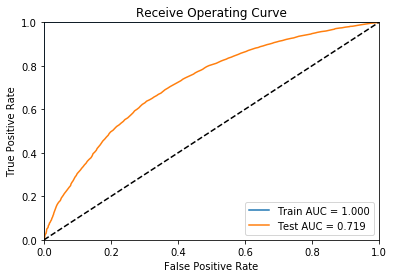

In [32]:
auc_bow_train_rf, auc_bow_test_rf, y_train_pred, y_test_pred = plot_roc_curve_rf(x_train_re, y_train_re, x_test, y_test, best_estimator_bow_rf, best_depth_bow_rf)

Text(25.5, 0.5, 'Actual')

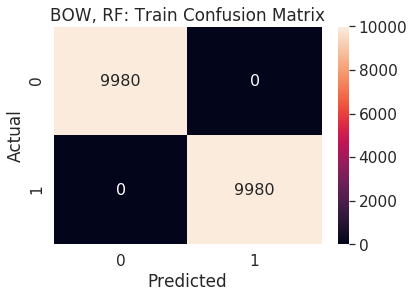

In [33]:
#Source: https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix
from sklearn.metrics import confusion_matrix
import seaborn

#Source: https://stackoverflow.com/questions/5326112/how-to-round-each-item-in-a-list-of-floats-to-2-decimal-places
formatted_y_train_pred = ['%.0f' % elem for elem in y_train_pred]
formatted_y_train = ['%.0f' % elem for elem in y_train_re]

conf_matrix = confusion_matrix(formatted_y_train, formatted_y_train_pred)
sns.set(font_scale=1.4)
ax = sns.heatmap(conf_matrix, annot=True,annot_kws={"size": 16}, fmt='g')
ax.set_title('BOW, RF: Train Confusion Matrix')
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')

Text(25.5, 0.5, 'Actual')

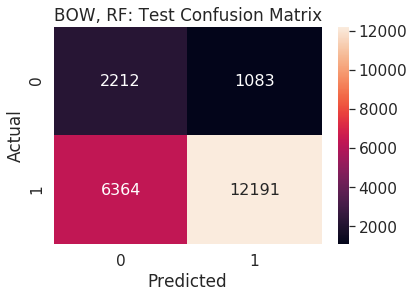

In [34]:
#Source: https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix
from sklearn.metrics import confusion_matrix
import seaborn

#Source: https://stackoverflow.com/questions/5326112/how-to-round-each-item-in-a-list-of-floats-to-2-decimal-places
formatted_y_test_pred = ['%.0f' % elem for elem in y_test_pred]
formatted_y_test = ['%.0f' % elem for elem in y_test]

conf_matrix = confusion_matrix(formatted_y_test, formatted_y_test_pred)
sns.set(font_scale=1.4)
ax = sns.heatmap(conf_matrix, annot=True,annot_kws={"size": 16}, fmt='g')
ax.set_title('BOW, RF: Test Confusion Matrix')
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')

### 2.4.2 Applying Random Forests on TFIDF,<font color='red'> SET 2</font>

In [35]:
#Preprocessing train data.
from scipy.sparse import hstack

#Numerical data.
prev_projects_norm = train_data['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)
price_norm = train_data['price'].values.reshape(-1,1)

#Categorical data.
vectorizer_categories = TargetEncoder()
categories_one_hot = vectorizer_categories.fit_transform(train_data['clean_categories'].values, y_train)

vectorizer_sub_categories = TargetEncoder()
sub_categories_one_hot = vectorizer_sub_categories.fit_transform(train_data['clean_subcategories'].values, y_train)

vectorizer_state = TargetEncoder()
state_one_hot = vectorizer_state.fit_transform(train_data['school_state'].values, y_train)

vectorizer_grade = TargetEncoder()
grade_one_hot = vectorizer_grade.fit_transform(train_data['project_grade_category'].values, y_train)

vectorizer_prefix = TargetEncoder()
prefix_one_hot = vectorizer_prefix.fit_transform(train_data['teacher_prefix'].values, y_train)

#Text data.
vectorizer = TfidfVectorizer(min_df=10)
essays = vectorizer.fit_transform(preprocessed_essays_train)
vectorizer_titles = TfidfVectorizer(min_df=10)
titles = vectorizer_titles.fit_transform(preprocessed_titles_train)

# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
x_train = hstack((categories_one_hot, sub_categories_one_hot, state_one_hot, grade_one_hot, prefix_one_hot, prev_projects_norm, price_norm, titles, essays))

In [36]:
#Preprocessing CV data.

prev_projects_norm = cv_data['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)
price_norm = cv_data['price'].values.reshape(-1,1)

categories_one_hot = vectorizer_categories.fit_transform(cv_data['clean_categories'].values, y_cv)
sub_categories_one_hot = vectorizer_sub_categories.fit_transform(cv_data['clean_subcategories'].values, y_cv)
state_one_hot = vectorizer_state.fit_transform(cv_data['school_state'].values, y_cv)
grade_one_hot = vectorizer_grade.fit_transform(cv_data['project_grade_category'].values, y_cv)
prefix_one_hot = vectorizer_prefix.fit_transform(cv_data['teacher_prefix'].values, y_cv)

essays = vectorizer.transform(preprocessed_essays_cv)
titles = vectorizer_titles.transform(preprocessed_titles_cv)

x_cv = hstack((categories_one_hot, sub_categories_one_hot, state_one_hot, grade_one_hot, prefix_one_hot, prev_projects_norm, price_norm, titles, essays))

In [37]:
#Preprocessing test data.

prev_projects_norm = test_data['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)
price_norm = test_data['price'].values.reshape(-1,1)

categories_one_hot = vectorizer_categories.fit_transform(test_data['clean_categories'].values, y_test)
sub_categories_one_hot = vectorizer_sub_categories.fit_transform(test_data['clean_subcategories'].values, y_test)
state_one_hot = vectorizer_state.fit_transform(test_data['school_state'].values, y_test)
grade_one_hot = vectorizer_grade.fit_transform(test_data['project_grade_category'].values, y_test)
prefix_one_hot = vectorizer_prefix.fit_transform(test_data['teacher_prefix'].values, y_test)

essays = vectorizer.transform(preprocessed_essays_test)
titles = vectorizer_titles.transform(preprocessed_titles_test)

x_test = hstack((categories_one_hot, sub_categories_one_hot, state_one_hot, grade_one_hot, prefix_one_hot, prev_projects_norm, price_norm, titles, essays))

In [38]:
#Rebalancing data
x_train_re, y_train_re = rus.fit_resample(x_train, y_train)

In [39]:
#Perform hyperparameter tuning and plot random forest.
print("For TFIDF, Random Forest:")
best_estimator_tfidf_rf, best_depth_tfidf_rf = plot_grid_search_rf()

For TFIDF, Random Forest:


The best number of estimators is 500 and the best depth is 500 with an AUC of 0.713987210582339.


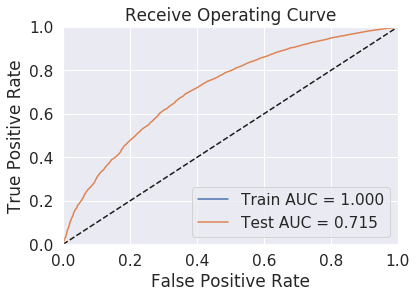

In [40]:
auc_tfidf_train_rf, auc_tfidf_test_rf, y_train_pred, y_test_pred = plot_roc_curve_rf(x_train_re, y_train_re, x_test, y_test, best_estimator_tfidf_rf, best_depth_tfidf_rf)

Text(25.5, 0.5, 'Actual')

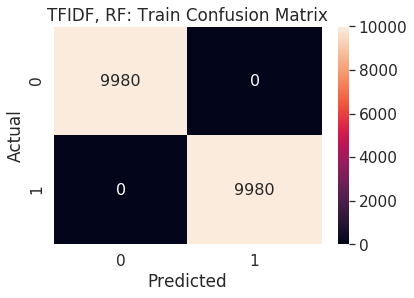

In [41]:
#Source: https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix
from sklearn.metrics import confusion_matrix
import seaborn

#Source: https://stackoverflow.com/questions/5326112/how-to-round-each-item-in-a-list-of-floats-to-2-decimal-places
formatted_y_train_pred = ['%.0f' % elem for elem in y_train_pred]
formatted_y_train = ['%.0f' % elem for elem in y_train_re]

conf_matrix = confusion_matrix(formatted_y_train, formatted_y_train_pred)
sns.set(font_scale=1.4)
ax = sns.heatmap(conf_matrix, annot=True,annot_kws={"size": 16}, fmt='g')
ax.set_title('TFIDF, RF: Train Confusion Matrix')
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')

Text(25.5, 0.5, 'Actual')

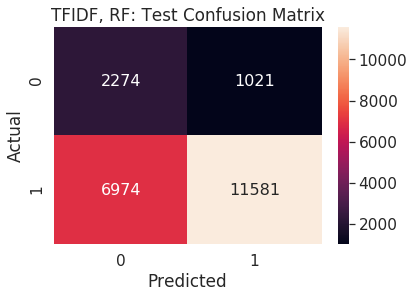

In [42]:
#Source: https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix
from sklearn.metrics import confusion_matrix
import seaborn

#Source: https://stackoverflow.com/questions/5326112/how-to-round-each-item-in-a-list-of-floats-to-2-decimal-places
formatted_y_test_pred = ['%.0f' % elem for elem in y_test_pred]
formatted_y_test = ['%.0f' % elem for elem in y_test]

conf_matrix = confusion_matrix(formatted_y_test, formatted_y_test_pred)
sns.set(font_scale=1.4)
ax = sns.heatmap(conf_matrix, annot=True,annot_kws={"size": 16}, fmt='g')
ax.set_title('TFIDF, RF: Test Confusion Matrix')
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')

### 2.4.3 Applying Random Forests on AVG W2V,<font color='red'> SET 3</font>

In [43]:
#Preprocessing train data.
from scipy.sparse import hstack

#Numerical data.
prev_projects_norm = train_data['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)
price_norm = train_data['price'].values.reshape(-1,1)

#Categorical data.
vectorizer_categories = TargetEncoder()
categories_one_hot = vectorizer_categories.fit_transform(train_data['clean_categories'].values, y_train)

vectorizer_sub_categories = TargetEncoder()
sub_categories_one_hot = vectorizer_sub_categories.fit_transform(train_data['clean_subcategories'].values, y_train)

vectorizer_state = TargetEncoder()
state_one_hot = vectorizer_state.fit_transform(train_data['school_state'].values, y_train)

vectorizer_grade = TargetEncoder()
grade_one_hot = vectorizer_grade.fit_transform(train_data['project_grade_category'].values, y_train)

vectorizer_prefix = TargetEncoder()
prefix_one_hot = vectorizer_prefix.fit_transform(train_data['teacher_prefix'].values, y_train)

#Text data.

model = loadGloveModel('glove.42B.300d.txt')
essays, titles = apply_avgw2v(preprocessed_essays_train,preprocessed_titles_train,model)

# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
x_train = hstack((categories_one_hot, sub_categories_one_hot, state_one_hot, grade_one_hot, prefix_one_hot, prev_projects_norm, price_norm, titles, essays))

Loading Glove Model



Done. 1917495  words loaded!
all the words in the corpus 10205801
the unique words in the corpus 47977
The number of words that are present in both glove vectors and our coupus 43101 ( 89.837 %)
word 2 vec length 43101


100%|██████████| 65548/65548 [00:01<00:00, 55968.04it/s]


In [44]:
#Preprocessing CV data.

prev_projects_norm = cv_data['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)
price_norm = cv_data['price'].values.reshape(-1,1)

categories_one_hot = vectorizer_categories.fit_transform(cv_data['clean_categories'].values, y_cv)
sub_categories_one_hot = vectorizer_sub_categories.fit_transform(cv_data['clean_subcategories'].values, y_cv)
state_one_hot = vectorizer_state.fit_transform(cv_data['school_state'].values, y_cv)
grade_one_hot = vectorizer_grade.fit_transform(cv_data['project_grade_category'].values, y_cv)
prefix_one_hot = vectorizer_prefix.fit_transform(cv_data['teacher_prefix'].values, y_cv)

essays, titles = apply_avgw2v(preprocessed_essays_cv,preprocessed_titles_cv, model)

x_cv = hstack((categories_one_hot, sub_categories_one_hot, state_one_hot, grade_one_hot, prefix_one_hot, prev_projects_norm, price_norm, titles, essays))

all the words in the corpus 3407843
the unique words in the corpus 31362
The number of words that are present in both glove vectors and our coupus 29590 ( 94.35 %)
word 2 vec length 29590


100%|██████████| 21850/21850 [00:00<00:00, 45590.44it/s]


In [45]:
#Preprocessing test data.

prev_projects_norm = test_data['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)
price_norm = test_data['price'].values.reshape(-1,1)

categories_one_hot = vectorizer_categories.fit_transform(test_data['clean_categories'].values, y_test)
sub_categories_one_hot = vectorizer_sub_categories.fit_transform(test_data['clean_subcategories'].values, y_test)
state_one_hot = vectorizer_state.fit_transform(test_data['school_state'].values, y_test)
grade_one_hot = vectorizer_grade.fit_transform(test_data['project_grade_category'].values, y_test)
prefix_one_hot = vectorizer_prefix.fit_transform(test_data['teacher_prefix'].values, y_test)

essays, titles = apply_avgw2v(preprocessed_essays_test,preprocessed_titles_test, model)

x_test = hstack((categories_one_hot, sub_categories_one_hot, state_one_hot, grade_one_hot, prefix_one_hot, prev_projects_norm, price_norm, titles, essays))

all the words in the corpus 3400769
the unique words in the corpus 31427
The number of words that are present in both glove vectors and our coupus 29607 ( 94.209 %)
word 2 vec length 29607


100%|██████████| 21850/21850 [00:00<00:00, 55043.79it/s]


In [46]:
#Rebalancing data
x_train_re, y_train_re = rus.fit_resample(x_train, y_train)

In [47]:
#Perform hyperparameter tuning and plot random forest.
print("For AVG W2V, Random Forest:")
best_estimator_avgw2v_rf, best_depth_avgw2v_rf = plot_grid_search_rf()

For AVG W2V, Random Forest:


The best number of estimators is 500 and the best depth is 10 with an AUC of 0.6992481106407324.


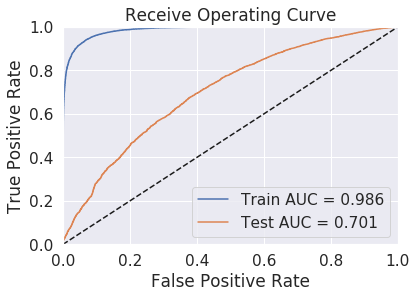

In [48]:
auc_avgw2v_train_rf, auc_avgw2v_test_rf, y_train_pred, y_test_pred = plot_roc_curve_rf(x_train_re, y_train_re, x_test, y_test, best_estimator_avgw2v_rf, best_depth_avgw2v_rf)

Text(25.5, 0.5, 'Actual')

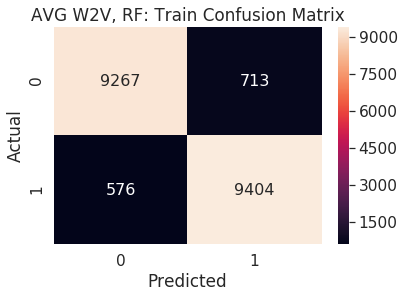

In [49]:
#Source: https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix
from sklearn.metrics import confusion_matrix
import seaborn

#Source: https://stackoverflow.com/questions/5326112/how-to-round-each-item-in-a-list-of-floats-to-2-decimal-places
formatted_y_train_pred = ['%.0f' % elem for elem in y_train_pred]
formatted_y_train = ['%.0f' % elem for elem in y_train_re]

conf_matrix = confusion_matrix(formatted_y_train, formatted_y_train_pred)
sns.set(font_scale=1.4)
ax = sns.heatmap(conf_matrix, annot=True,annot_kws={"size": 16}, fmt='g')
ax.set_title('AVG W2V, RF: Train Confusion Matrix')
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')

Text(25.5, 0.5, 'Actual')

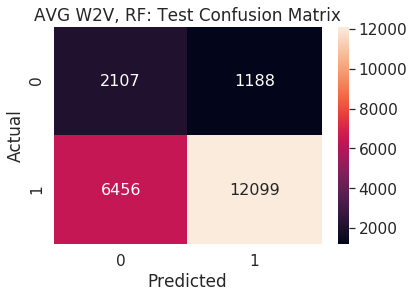

In [50]:
#Source: https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix
from sklearn.metrics import confusion_matrix
import seaborn

#Source: https://stackoverflow.com/questions/5326112/how-to-round-each-item-in-a-list-of-floats-to-2-decimal-places
formatted_y_test_pred = ['%.0f' % elem for elem in y_test_pred]
formatted_y_test = ['%.0f' % elem for elem in y_test]

conf_matrix = confusion_matrix(formatted_y_test, formatted_y_test_pred)
sns.set(font_scale=1.4)
ax = sns.heatmap(conf_matrix, annot=True,annot_kws={"size": 16}, fmt='g')
ax.set_title('AVG W2V, RF: Test Confusion Matrix')
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')

### 2.4.4 Applying Random Forests on TFIDF W2V,<font color='red'> SET 4</font>

In [51]:
#Preprocessing train data.
from scipy.sparse import hstack

#Numerical data.
prev_projects_norm = train_data['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)
price_norm = train_data['price'].values.reshape(-1,1)

#Categorical data.
vectorizer_categories = TargetEncoder()
categories_one_hot = vectorizer_categories.fit_transform(train_data['clean_categories'].values, y_train)

vectorizer_sub_categories = TargetEncoder()
sub_categories_one_hot = vectorizer_sub_categories.fit_transform(train_data['clean_subcategories'].values, y_train)

vectorizer_state = TargetEncoder()
state_one_hot = vectorizer_state.fit_transform(train_data['school_state'].values, y_train)

vectorizer_grade = TargetEncoder()
grade_one_hot = vectorizer_grade.fit_transform(train_data['project_grade_category'].values, y_train)

vectorizer_prefix = TargetEncoder()
prefix_one_hot = vectorizer_prefix.fit_transform(train_data['teacher_prefix'].values, y_train)

#Text data.

essays, titles, essays_vocab, titles_vocab = apply_tfidfw2v(preprocessed_essays_train,preprocessed_titles_train)

# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
x_train = hstack((categories_one_hot, sub_categories_one_hot, state_one_hot, grade_one_hot, prefix_one_hot, prev_projects_norm, price_norm, titles, essays))

 95%|█████████▌| 62451/65548 [02:21<00:06, 450.78it/s]

In [52]:
#Preprocessing CV data.

prev_projects_norm = cv_data['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)
price_norm = cv_data['price'].values.reshape(-1,1)

categories_one_hot = vectorizer_categories.fit_transform(cv_data['clean_categories'].values, y_cv)
sub_categories_one_hot = vectorizer_sub_categories.fit_transform(cv_data['clean_subcategories'].values, y_cv)
state_one_hot = vectorizer_state.fit_transform(cv_data['school_state'].values, y_cv)
grade_one_hot = vectorizer_grade.fit_transform(cv_data['project_grade_category'].values, y_cv)
prefix_one_hot = vectorizer_prefix.fit_transform(cv_data['teacher_prefix'].values, y_cv)

essays, titles = apply_tfidfw2v_vocab(preprocessed_essays_cv, preprocessed_titles_cv, essays_vocab, titles_vocab)

x_cv = hstack((categories_one_hot, sub_categories_one_hot, state_one_hot, grade_one_hot, prefix_one_hot, prev_projects_norm, price_norm, titles, essays))

In [53]:
#Preprocessing test data.

prev_projects_norm = test_data['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)
price_norm = test_data['price'].values.reshape(-1,1)

categories_one_hot = vectorizer_categories.fit_transform(test_data['clean_categories'].values, y_test)
sub_categories_one_hot = vectorizer_sub_categories.fit_transform(test_data['clean_subcategories'].values, y_test)
state_one_hot = vectorizer_state.fit_transform(test_data['school_state'].values, y_test)
grade_one_hot = vectorizer_grade.fit_transform(test_data['project_grade_category'].values, y_test)
prefix_one_hot = vectorizer_prefix.fit_transform(test_data['teacher_prefix'].values, y_test)

essays, titles = apply_tfidfw2v_vocab(preprocessed_essays_test, preprocessed_titles_test, essays_vocab, titles_vocab)

x_test = hstack((categories_one_hot, sub_categories_one_hot, state_one_hot, grade_one_hot, prefix_one_hot, prev_projects_norm, price_norm, titles, essays))

100%|██████████| 21850/21850 [00:00<00:00, 29209.78it/s]


In [54]:
#Rebalancing data
x_train_re, y_train_re = rus.fit_resample(x_train, y_train)

In [55]:
#Perform hyperparameter tuning and plot random forest.
print("For TFIDF W2V, Random Forest:")
best_estimator_tfidfw2v_rf, best_depth_tfidfw2v_rf = plot_grid_search_rf()

For TFIDF W2V, Random Forest:


The best number of estimators is 500 and the best depth is 10 with an AUC of 0.6990608782862701.


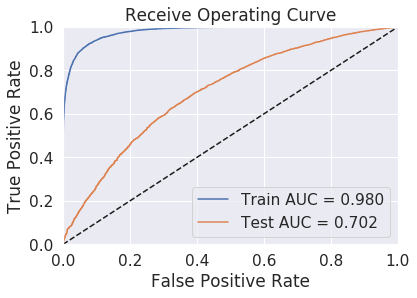

In [56]:
auc_tfidfw2v_train_rf, auc_tfidfw2v_test_rf, y_train_pred, y_test_pred = plot_roc_curve_rf(x_train_re, y_train_re, x_test, y_test, best_estimator_tfidfw2v_rf, best_depth_tfidfw2v_rf)

Text(25.5, 0.5, 'Actual')

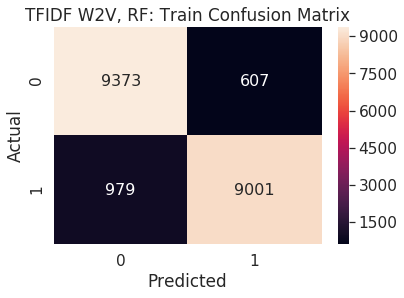

In [57]:
#Source: https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix
from sklearn.metrics import confusion_matrix
import seaborn

#Source: https://stackoverflow.com/questions/5326112/how-to-round-each-item-in-a-list-of-floats-to-2-decimal-places
formatted_y_train_pred = ['%.0f' % elem for elem in y_train_pred]
formatted_y_train = ['%.0f' % elem for elem in y_train_re]

conf_matrix = confusion_matrix(formatted_y_train, formatted_y_train_pred)
sns.set(font_scale=1.4)
ax = sns.heatmap(conf_matrix, annot=True,annot_kws={"size": 16}, fmt='g')
ax.set_title('TFIDF W2V, RF: Train Confusion Matrix')
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')

Text(25.5, 0.5, 'Actual')

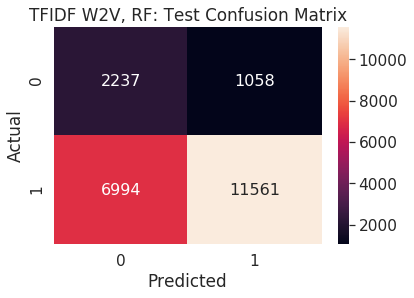

In [58]:
#Source: https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix
from sklearn.metrics import confusion_matrix
import seaborn

#Source: https://stackoverflow.com/questions/5326112/how-to-round-each-item-in-a-list-of-floats-to-2-decimal-places
formatted_y_test_pred = ['%.0f' % elem for elem in y_test_pred]
formatted_y_test = ['%.0f' % elem for elem in y_test]

conf_matrix = confusion_matrix(formatted_y_test, formatted_y_test_pred)
sns.set(font_scale=1.4)
ax = sns.heatmap(conf_matrix, annot=True,annot_kws={"size": 16}, fmt='g')
ax.set_title('TFIDF W2V, RF: Test Confusion Matrix')
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')

<h2>2.5 Applying GBDT</h2>

<br>Apply GBDT on different kind of featurization as mentioned in the instructions
<br> For Every model that you work on make sure you do the step 2 and step 3 of instrucations

### 2.5.1 Applying XGBOOST on BOW,<font color='red'> SET 1</font>

In [59]:
#Preprocessing train data.

#Numerical data.
prev_projects_norm = train_data['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)
price_norm = train_data['price'].values.reshape(-1,1)

#Categorical data.

vectorizer_categories = TargetEncoder()
categories_one_hot = vectorizer_categories.fit_transform(train_data['clean_categories'].values, y_train)

vectorizer_sub_categories = TargetEncoder()
sub_categories_one_hot = vectorizer_sub_categories.fit_transform(train_data['clean_subcategories'].values, y_train)

vectorizer_state = TargetEncoder()
state_one_hot = vectorizer_state.fit_transform(train_data['school_state'].values, y_train)

vectorizer_grade = TargetEncoder()
grade_one_hot = vectorizer_grade.fit_transform(train_data['project_grade_category'].values, y_train)

vectorizer_prefix = TargetEncoder()
prefix_one_hot = vectorizer_prefix.fit_transform(train_data['teacher_prefix'].values, y_train)

#Text data.

vectorizer = CountVectorizer(min_df=10)
essays = vectorizer.fit_transform(preprocessed_essays_train)

vectorizer_titles = CountVectorizer(min_df=10)
titles = vectorizer_titles.fit_transform(preprocessed_titles_train)

# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
x_train = hstack((categories_one_hot, sub_categories_one_hot, state_one_hot, grade_one_hot, prefix_one_hot, prev_projects_norm, price_norm, titles, essays))

In [60]:
#Preprocessing CV data.
categories_one_hot = vectorizer_categories.fit_transform(cv_data['clean_categories'].values, y_cv)
sub_categories_one_hot = vectorizer_sub_categories.fit_transform(cv_data['clean_subcategories'].values, y_cv)
state_one_hot = vectorizer_state.fit_transform(cv_data['school_state'].values, y_cv)
grade_one_hot = vectorizer_grade.fit_transform(cv_data['project_grade_category'].values, y_cv)
prefix_one_hot = vectorizer_prefix.fit_transform(cv_data['teacher_prefix'].values, y_cv)

prev_projects_norm = cv_data['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)
price_norm = cv_data['price'].values.reshape(-1,1)

essays = vectorizer.transform(preprocessed_essays_cv)
titles = vectorizer_titles.transform(preprocessed_titles_cv)

x_cv = hstack((categories_one_hot, sub_categories_one_hot, state_one_hot, grade_one_hot, prefix_one_hot, prev_projects_norm, price_norm, titles, essays))

In [61]:
#Preprocessing test data.
categories_one_hot = vectorizer_categories.fit_transform(test_data['clean_categories'].values, y_test)
sub_categories_one_hot = vectorizer_sub_categories.fit_transform(test_data['clean_subcategories'].values, y_test)
state_one_hot = vectorizer_state.fit_transform(test_data['school_state'].values, y_test)
grade_one_hot = vectorizer_grade.fit_transform(test_data['project_grade_category'].values, y_test)
prefix_one_hot = vectorizer_prefix.fit_transform(test_data['teacher_prefix'].values, y_test)

prev_projects_norm = test_data['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)
price_norm = test_data['price'].values.reshape(-1,1)

essays = vectorizer.transform(preprocessed_essays_test)
titles = vectorizer_titles.transform(preprocessed_titles_test)

x_test = hstack((categories_one_hot, sub_categories_one_hot, state_one_hot, grade_one_hot, prefix_one_hot, prev_projects_norm, price_norm, titles, essays))

In [62]:
#Rebalancing data
x_train_re, y_train_re = rus.fit_resample(x_train, y_train)

In [63]:
#Perform hyperparameter tuning and plot random forest.
print("For BOW, GBDT:")
best_estimator_bow_gbdt, best_depth_bow_gdbt = plot_grid_search_gbdt()

For BOW, GBDT:


The best number of estimators is 500 and the best depth is 3 with an AUC of 0.7278900570692188.


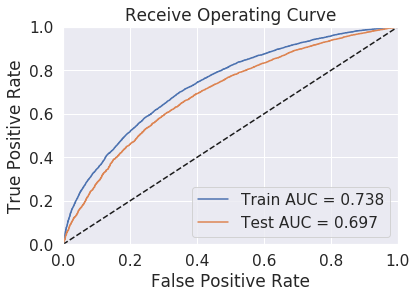

In [64]:
auc_bow_train_gbdt, auc_bow_test_gbdt, y_train_pred, y_test_pred = plot_roc_curve_rf(x_train_re, y_train_re, x_test, y_test, best_estimator_bow_gbdt, best_depth_bow_gdbt)

Text(25.5, 0.5, 'Actual')

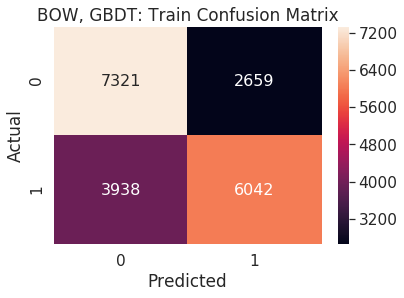

In [65]:
#Source: https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix
from sklearn.metrics import confusion_matrix
import seaborn

#Source: https://stackoverflow.com/questions/5326112/how-to-round-each-item-in-a-list-of-floats-to-2-decimal-places
formatted_y_train_pred = ['%.0f' % elem for elem in y_train_pred]
formatted_y_train = ['%.0f' % elem for elem in y_train_re]

conf_matrix = confusion_matrix(formatted_y_train, formatted_y_train_pred)
sns.set(font_scale=1.4)
ax = sns.heatmap(conf_matrix, annot=True,annot_kws={"size": 16}, fmt='g')
ax.set_title('BOW, GBDT: Train Confusion Matrix')
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')

Text(25.5, 0.5, 'Actual')

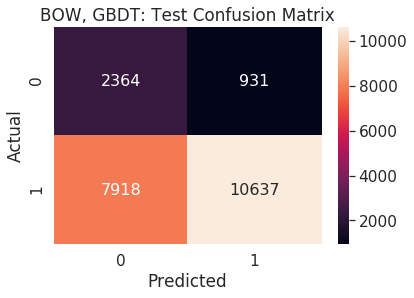

In [66]:
#Source: https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix
from sklearn.metrics import confusion_matrix
import seaborn

#Source: https://stackoverflow.com/questions/5326112/how-to-round-each-item-in-a-list-of-floats-to-2-decimal-places
formatted_y_test_pred = ['%.0f' % elem for elem in y_test_pred]
formatted_y_test = ['%.0f' % elem for elem in y_test]

conf_matrix = confusion_matrix(formatted_y_test, formatted_y_test_pred)
sns.set(font_scale=1.4)
ax = sns.heatmap(conf_matrix, annot=True,annot_kws={"size": 16}, fmt='g')
ax.set_title('BOW, GBDT: Test Confusion Matrix')
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')

### 2.5.2 Applying XGBOOST on TFIDF,<font color='red'> SET 2</font>

In [67]:
#Preprocessing train data.
from scipy.sparse import hstack

#Numerical data.
prev_projects_norm = train_data['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)
price_norm = train_data['price'].values.reshape(-1,1)

#Categorical data.
vectorizer_categories = TargetEncoder()
categories_one_hot = vectorizer_categories.fit_transform(train_data['clean_categories'].values, y_train)

vectorizer_sub_categories = TargetEncoder()
sub_categories_one_hot = vectorizer_sub_categories.fit_transform(train_data['clean_subcategories'].values, y_train)

vectorizer_state = TargetEncoder()
state_one_hot = vectorizer_state.fit_transform(train_data['school_state'].values, y_train)

vectorizer_grade = TargetEncoder()
grade_one_hot = vectorizer_grade.fit_transform(train_data['project_grade_category'].values, y_train)

vectorizer_prefix = TargetEncoder()
prefix_one_hot = vectorizer_prefix.fit_transform(train_data['teacher_prefix'].values, y_train)

#Text data.
vectorizer = TfidfVectorizer(min_df=10)
essays = vectorizer.fit_transform(preprocessed_essays_train)
vectorizer_titles = TfidfVectorizer(min_df=10)
titles = vectorizer_titles.fit_transform(preprocessed_titles_train)

# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
x_train = hstack((categories_one_hot, sub_categories_one_hot, state_one_hot, grade_one_hot, prefix_one_hot, prev_projects_norm, price_norm, titles, essays))

In [68]:
#Preprocessing CV data.

prev_projects_norm = cv_data['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)
price_norm = cv_data['price'].values.reshape(-1,1)

categories_one_hot = vectorizer_categories.fit_transform(cv_data['clean_categories'].values, y_cv)
sub_categories_one_hot = vectorizer_sub_categories.fit_transform(cv_data['clean_subcategories'].values, y_cv)
state_one_hot = vectorizer_state.fit_transform(cv_data['school_state'].values, y_cv)
grade_one_hot = vectorizer_grade.fit_transform(cv_data['project_grade_category'].values, y_cv)
prefix_one_hot = vectorizer_prefix.fit_transform(cv_data['teacher_prefix'].values, y_cv)

essays = vectorizer.transform(preprocessed_essays_cv)
titles = vectorizer_titles.transform(preprocessed_titles_cv)

x_cv = hstack((categories_one_hot, sub_categories_one_hot, state_one_hot, grade_one_hot, prefix_one_hot, prev_projects_norm, price_norm, titles, essays))

In [69]:
#Preprocessing test data.

prev_projects_norm = test_data['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)
price_norm = test_data['price'].values.reshape(-1,1)

categories_one_hot = vectorizer_categories.fit_transform(test_data['clean_categories'].values, y_test)
sub_categories_one_hot = vectorizer_sub_categories.fit_transform(test_data['clean_subcategories'].values, y_test)
state_one_hot = vectorizer_state.fit_transform(test_data['school_state'].values, y_test)
grade_one_hot = vectorizer_grade.fit_transform(test_data['project_grade_category'].values, y_test)
prefix_one_hot = vectorizer_prefix.fit_transform(test_data['teacher_prefix'].values, y_test)

essays = vectorizer.transform(preprocessed_essays_test)
titles = vectorizer_titles.transform(preprocessed_titles_test)

x_test = hstack((categories_one_hot, sub_categories_one_hot, state_one_hot, grade_one_hot, prefix_one_hot, prev_projects_norm, price_norm, titles, essays))

In [70]:
#Rebalancing data
x_train_re, y_train_re = rus.fit_resample(x_train, y_train)

In [71]:
#Perform hyperparameter tuning and plot random forest.
print("For TFIDF, GBDT:")
best_estimator_tfidf_gbdt, best_depth_tfidf_gbdt = plot_grid_search_gbdt()

For TFIDF, GBDT:


The best number of estimators is 500 and the best depth is 2 with an AUC of 0.7223044812508301.


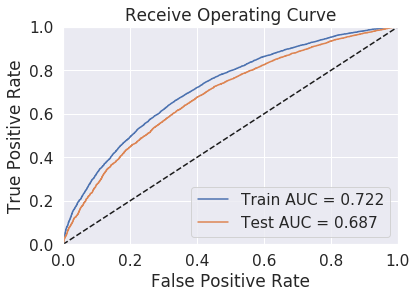

In [72]:
auc_tfidf_train_gbdt, auc_tfidf_test_gbdt, y_train_pred, y_test_pred = plot_roc_curve_rf(x_train_re, y_train_re, x_test, y_test, best_estimator_tfidf_gbdt, best_depth_tfidf_gbdt)

Text(25.5, 0.5, 'Actual')

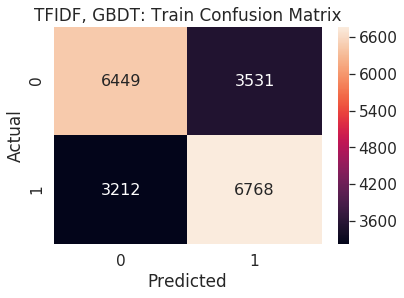

In [73]:
#Source: https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix
from sklearn.metrics import confusion_matrix
import seaborn

#Source: https://stackoverflow.com/questions/5326112/how-to-round-each-item-in-a-list-of-floats-to-2-decimal-places
formatted_y_train_pred = ['%.0f' % elem for elem in y_train_pred]
formatted_y_train = ['%.0f' % elem for elem in y_train_re]

conf_matrix = confusion_matrix(formatted_y_train, formatted_y_train_pred)
sns.set(font_scale=1.4)
ax = sns.heatmap(conf_matrix, annot=True,annot_kws={"size": 16}, fmt='g')
ax.set_title('TFIDF, GBDT: Train Confusion Matrix')
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')

Text(25.5, 0.5, 'Actual')

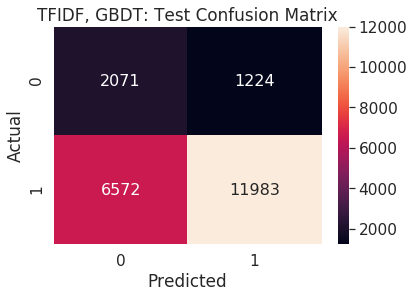

In [74]:
#Source: https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix
from sklearn.metrics import confusion_matrix
import seaborn

#Source: https://stackoverflow.com/questions/5326112/how-to-round-each-item-in-a-list-of-floats-to-2-decimal-places
formatted_y_test_pred = ['%.0f' % elem for elem in y_test_pred]
formatted_y_test = ['%.0f' % elem for elem in y_test]

conf_matrix = confusion_matrix(formatted_y_test, formatted_y_test_pred)
sns.set(font_scale=1.4)
ax = sns.heatmap(conf_matrix, annot=True,annot_kws={"size": 16}, fmt='g')
ax.set_title('TFIDF, GBDT: Test Confusion Matrix')
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')

### 2.5.3 Applying XGBOOST on AVG W2V,<font color='red'> SET 3</font>

In [75]:
#Preprocessing train data.
from scipy.sparse import hstack

#Numerical data.
prev_projects_norm = train_data['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)
price_norm = train_data['price'].values.reshape(-1,1)

#Categorical data.
vectorizer_categories = TargetEncoder()
categories_one_hot = vectorizer_categories.fit_transform(train_data['clean_categories'].values, y_train)

vectorizer_sub_categories = TargetEncoder()
sub_categories_one_hot = vectorizer_sub_categories.fit_transform(train_data['clean_subcategories'].values, y_train)

vectorizer_state = TargetEncoder()
state_one_hot = vectorizer_state.fit_transform(train_data['school_state'].values, y_train)

vectorizer_grade = TargetEncoder()
grade_one_hot = vectorizer_grade.fit_transform(train_data['project_grade_category'].values, y_train)

vectorizer_prefix = TargetEncoder()
prefix_one_hot = vectorizer_prefix.fit_transform(train_data['teacher_prefix'].values, y_train)

#Text data.

model = loadGloveModel('glove.42B.300d.txt')
essays, titles = apply_avgw2v(preprocessed_essays_train,preprocessed_titles_train,model)

# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
x_train = hstack((categories_one_hot, sub_categories_one_hot, state_one_hot, grade_one_hot, prefix_one_hot, prev_projects_norm, price_norm, titles, essays))

Loading Glove Model



Done. 1917495  words loaded!
all the words in the corpus 10205801
the unique words in the corpus 47977
The number of words that are present in both glove vectors and our coupus 43101 ( 89.837 %)
word 2 vec length 43101


100%|██████████| 65548/65548 [00:01<00:00, 58976.43it/s]


In [76]:
#Preprocessing CV data.

prev_projects_norm = cv_data['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)
price_norm = cv_data['price'].values.reshape(-1,1)

categories_one_hot = vectorizer_categories.fit_transform(cv_data['clean_categories'].values, y_cv)
sub_categories_one_hot = vectorizer_sub_categories.fit_transform(cv_data['clean_subcategories'].values, y_cv)
state_one_hot = vectorizer_state.fit_transform(cv_data['school_state'].values, y_cv)
grade_one_hot = vectorizer_grade.fit_transform(cv_data['project_grade_category'].values, y_cv)
prefix_one_hot = vectorizer_prefix.fit_transform(cv_data['teacher_prefix'].values, y_cv)

essays, titles = apply_avgw2v(preprocessed_essays_cv,preprocessed_titles_cv, model)

x_cv = hstack((categories_one_hot, sub_categories_one_hot, state_one_hot, grade_one_hot, prefix_one_hot, prev_projects_norm, price_norm, titles, essays))

all the words in the corpus 3407843
the unique words in the corpus 31362
The number of words that are present in both glove vectors and our coupus 29590 ( 94.35 %)
word 2 vec length 29590


100%|██████████| 21850/21850 [00:00<00:00, 53908.79it/s]


In [77]:
#Preprocessing test data.

prev_projects_norm = test_data['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)
price_norm = test_data['price'].values.reshape(-1,1)

categories_one_hot = vectorizer_categories.fit_transform(test_data['clean_categories'].values, y_test)
sub_categories_one_hot = vectorizer_sub_categories.fit_transform(test_data['clean_subcategories'].values, y_test)
state_one_hot = vectorizer_state.fit_transform(test_data['school_state'].values, y_test)
grade_one_hot = vectorizer_grade.fit_transform(test_data['project_grade_category'].values, y_test)
prefix_one_hot = vectorizer_prefix.fit_transform(test_data['teacher_prefix'].values, y_test)

essays, titles = apply_avgw2v(preprocessed_essays_test,preprocessed_titles_test, model)

x_test = hstack((categories_one_hot, sub_categories_one_hot, state_one_hot, grade_one_hot, prefix_one_hot, prev_projects_norm, price_norm, titles, essays))

all the words in the corpus 3400769
the unique words in the corpus 31427
The number of words that are present in both glove vectors and our coupus 29607 ( 94.209 %)
word 2 vec length 29607


100%|██████████| 21850/21850 [00:00<00:00, 43069.49it/s]


In [78]:
#Rebalancing data
x_train_re, y_train_re = rus.fit_resample(x_train, y_train)

In [79]:
#Perform hyperparameter tuning and plot random forest.
print("For AVG W2V, GBDT:")
best_estimator_avgw2v_gbdt, best_depth_avgw2v_gbdt = plot_grid_search_gbdt()

For AVG W2V, GBDT:


The best number of estimators is 500 and the best depth is 10 with an AUC of 0.7140411302719962.


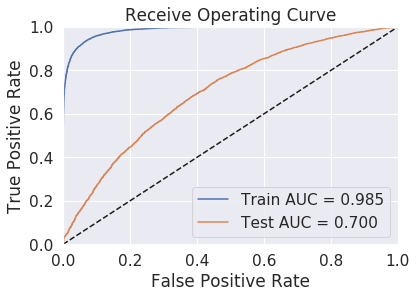

In [80]:
auc_avgw2v_train_gbdt, auc_avgw2v_test_gbdt, y_train_pred, y_test_pred = plot_roc_curve_rf(x_train_re, y_train_re, x_test, y_test, best_estimator_avgw2v_gbdt, best_depth_avgw2v_gbdt)

Text(25.5, 0.5, 'Actual')

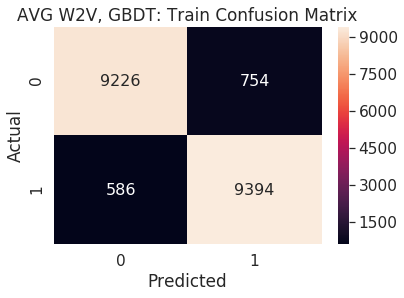

In [81]:
#Source: https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix
from sklearn.metrics import confusion_matrix
import seaborn

#Source: https://stackoverflow.com/questions/5326112/how-to-round-each-item-in-a-list-of-floats-to-2-decimal-places
formatted_y_train_pred = ['%.0f' % elem for elem in y_train_pred]
formatted_y_train = ['%.0f' % elem for elem in y_train_re]

conf_matrix = confusion_matrix(formatted_y_train, formatted_y_train_pred)
sns.set(font_scale=1.4)
ax = sns.heatmap(conf_matrix, annot=True,annot_kws={"size": 16}, fmt='g')
ax.set_title('AVG W2V, GBDT: Train Confusion Matrix')
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')

Text(25.5, 0.5, 'Actual')

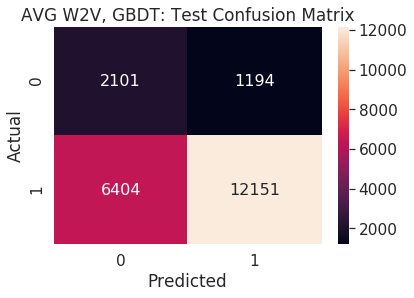

In [82]:
#Source: https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix
from sklearn.metrics import confusion_matrix
import seaborn

#Source: https://stackoverflow.com/questions/5326112/how-to-round-each-item-in-a-list-of-floats-to-2-decimal-places
formatted_y_test_pred = ['%.0f' % elem for elem in y_test_pred]
formatted_y_test = ['%.0f' % elem for elem in y_test]

conf_matrix = confusion_matrix(formatted_y_test, formatted_y_test_pred)
sns.set(font_scale=1.4)
ax = sns.heatmap(conf_matrix, annot=True,annot_kws={"size": 16}, fmt='g')
ax.set_title('AVG W2V, GBDT: Test Confusion Matrix')
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')

### 2.5.4 Applying XGBOOST on TFIDF W2V,<font color='red'> SET 4</font>

In [83]:
#Preprocessing train data.
from scipy.sparse import hstack

#Numerical data.
prev_projects_norm = train_data['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)
price_norm = train_data['price'].values.reshape(-1,1)

#Categorical data.
vectorizer_categories = TargetEncoder()
categories_one_hot = vectorizer_categories.fit_transform(train_data['clean_categories'].values, y_train)

vectorizer_sub_categories = TargetEncoder()
sub_categories_one_hot = vectorizer_sub_categories.fit_transform(train_data['clean_subcategories'].values, y_train)

vectorizer_state = TargetEncoder()
state_one_hot = vectorizer_state.fit_transform(train_data['school_state'].values, y_train)

vectorizer_grade = TargetEncoder()
grade_one_hot = vectorizer_grade.fit_transform(train_data['project_grade_category'].values, y_train)

vectorizer_prefix = TargetEncoder()
prefix_one_hot = vectorizer_prefix.fit_transform(train_data['teacher_prefix'].values, y_train)

#Text data.

essays, titles, essays_vocab, titles_vocab = apply_tfidfw2v(preprocessed_essays_train,preprocessed_titles_train)

# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
x_train = hstack((categories_one_hot, sub_categories_one_hot, state_one_hot, grade_one_hot, prefix_one_hot, prev_projects_norm, price_norm, titles, essays))

100%|██████████| 65548/65548 [00:02<00:00, 26829.94it/s]


In [84]:
#Preprocessing CV data.

prev_projects_norm = cv_data['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)
price_norm = cv_data['price'].values.reshape(-1,1)

categories_one_hot = vectorizer_categories.fit_transform(cv_data['clean_categories'].values, y_cv)
sub_categories_one_hot = vectorizer_sub_categories.fit_transform(cv_data['clean_subcategories'].values, y_cv)
state_one_hot = vectorizer_state.fit_transform(cv_data['school_state'].values, y_cv)
grade_one_hot = vectorizer_grade.fit_transform(cv_data['project_grade_category'].values, y_cv)
prefix_one_hot = vectorizer_prefix.fit_transform(cv_data['teacher_prefix'].values, y_cv)

essays, titles = apply_tfidfw2v_vocab(preprocessed_essays_cv, preprocessed_titles_cv, essays_vocab, titles_vocab)

x_cv = hstack((categories_one_hot, sub_categories_one_hot, state_one_hot, grade_one_hot, prefix_one_hot, prev_projects_norm, price_norm, titles, essays))

100%|██████████| 21850/21850 [00:00<00:00, 27803.05it/s]


In [85]:
#Preprocessing test data.

prev_projects_norm = test_data['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)
price_norm = test_data['price'].values.reshape(-1,1)

categories_one_hot = vectorizer_categories.fit_transform(test_data['clean_categories'].values, y_test)
sub_categories_one_hot = vectorizer_sub_categories.fit_transform(test_data['clean_subcategories'].values, y_test)
state_one_hot = vectorizer_state.fit_transform(test_data['school_state'].values, y_test)
grade_one_hot = vectorizer_grade.fit_transform(test_data['project_grade_category'].values, y_test)
prefix_one_hot = vectorizer_prefix.fit_transform(test_data['teacher_prefix'].values, y_test)

essays, titles = apply_tfidfw2v_vocab(preprocessed_essays_test, preprocessed_titles_test, essays_vocab, titles_vocab)

x_test = hstack((categories_one_hot, sub_categories_one_hot, state_one_hot, grade_one_hot, prefix_one_hot, prev_projects_norm, price_norm, titles, essays))

100%|██████████| 21850/21850 [00:00<00:00, 27419.89it/s]


In [86]:
#Rebalancing data
x_train_re, y_train_re = rus.fit_resample(x_train, y_train)

In [87]:
#Perform hyperparameter tuning and plot random forest.
print("For TFIDF W2V, GBDT:")
best_estimator_tfidfw2v_gbdt, best_depth_tfidfw2v_gbdt = plot_grid_search_gbdt()

For TFIDF W2V, GBDT:


The best number of estimators is 500 and the best depth is 20 with an AUC of 0.7113235845019049.


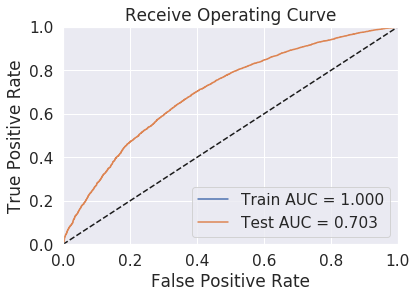

In [88]:
auc_tfidfw2v_train_gbdt, auc_tfidfw2v_test_gbdt, y_train_pred, y_test_pred = plot_roc_curve_rf(x_train_re, y_train_re, x_test, y_test, best_estimator_tfidfw2v_gbdt, best_depth_tfidfw2v_gbdt)

Text(25.5, 0.5, 'Actual')

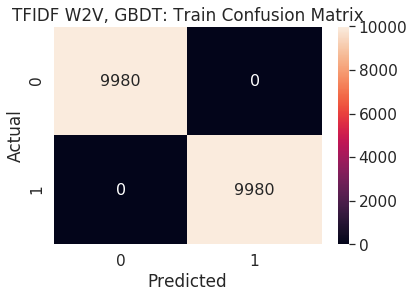

In [89]:
#Source: https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix
from sklearn.metrics import confusion_matrix
import seaborn

#Source: https://stackoverflow.com/questions/5326112/how-to-round-each-item-in-a-list-of-floats-to-2-decimal-places
formatted_y_train_pred = ['%.0f' % elem for elem in y_train_pred]
formatted_y_train = ['%.0f' % elem for elem in y_train_re]

conf_matrix = confusion_matrix(formatted_y_train, formatted_y_train_pred)
sns.set(font_scale=1.4)
ax = sns.heatmap(conf_matrix, annot=True,annot_kws={"size": 16}, fmt='g')
ax.set_title('TFIDF W2V, GBDT: Train Confusion Matrix')
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')

Text(25.5, 0.5, 'Actual')

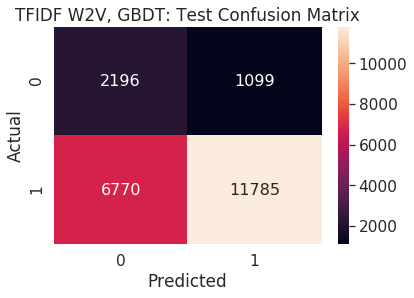

In [90]:
#Source: https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix
from sklearn.metrics import confusion_matrix
import seaborn

#Source: https://stackoverflow.com/questions/5326112/how-to-round-each-item-in-a-list-of-floats-to-2-decimal-places
formatted_y_test_pred = ['%.0f' % elem for elem in y_test_pred]
formatted_y_test = ['%.0f' % elem for elem in y_test]

conf_matrix = confusion_matrix(formatted_y_test, formatted_y_test_pred)
sns.set(font_scale=1.4)
ax = sns.heatmap(conf_matrix, annot=True,annot_kws={"size": 16}, fmt='g')
ax.set_title('TFIDF W2V, GBDT: Test Confusion Matrix')
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')

<h1>3. Conclusion</h1>

In [97]:
# Please compare all your models using Prettytable library
from prettytable import PrettyTable
    
x = PrettyTable()

x.field_names = ["Vectorizer", "Model", "# of Estimators", "Max Depth", "Train AUC", "Test AUC"]

x.add_row(["BOW", "Random Forest", best_estimator_bow_rf, best_depth_bow_rf, '%0.2f' % auc_bow_train_rf, '%0.2f' % auc_bow_test_rf])
x.add_row(["TFIDF", "Random Forest", best_estimator_tfidf_rf, best_depth_tfidf_rf, '%0.2f' % auc_tfidf_train_rf, '%0.2f' % auc_tfidfw2v_test_rf])
x.add_row(["AVG W2V", "Random Forest", best_estimator_avgw2v_rf, best_depth_avgw2v_rf, '%0.2f' % auc_tfidfw2v_train_rf, '%0.2f' % auc_avgw2v_test_rf])
x.add_row(["TFIDF W2V", "Random Forest", best_estimator_tfidfw2v_rf, best_depth_tfidfw2v_rf, '%0.2f' % auc_tfidfw2v_train_rf, '%0.2f' % auc_tfidfw2v_test_rf])
x.add_row(["BOW", "GBDT", best_estimator_bow_gbdt, best_depth_bow_gdbt, '%0.2f' % auc_bow_train_gbdt, '%0.2f' % auc_bow_test_gbdt])
x.add_row(["TFIDF", "GBDT", best_estimator_tfidf_gbdt, best_depth_tfidf_gbdt, '%0.2f' % auc_tfidf_train_gbdt, '%0.2f' % auc_tfidf_test_gbdt])
x.add_row(["AVG W2V", "GBDT", best_estimator_avgw2v_gbdt, best_depth_avgw2v_gbdt, '%0.2f' % auc_avgw2v_train_gbdt, '%0.2f' % auc_avgw2v_test_gbdt])
x.add_row(["TFIDF W2V", "GBDT", best_estimator_tfidfw2v_gbdt, best_depth_tfidfw2v_gbdt, '%0.2f' % auc_tfidfw2v_train_gbdt, '%0.2f' % auc_tfidfw2v_test_gbdt])

print(x)

+------------+---------------+-----------------+-----------+-----------+----------+
| Vectorizer |     Model     | # of Estimators | Max Depth | Train AUC | Test AUC |
+------------+---------------+-----------------+-----------+-----------+----------+
|    BOW     | Random Forest |       500       |    500    |    1.00   |   0.72   |
|   TFIDF    | Random Forest |       500       |    500    |    1.00   |   0.70   |
|  AVG W2V   | Random Forest |       500       |     10    |    0.98   |   0.70   |
| TFIDF W2V  | Random Forest |       500       |     10    |    0.98   |   0.70   |
|    BOW     |      GBDT     |       500       |     3     |    0.74   |   0.70   |
|   TFIDF    |      GBDT     |       500       |     2     |    0.72   |   0.69   |
|  AVG W2V   |      GBDT     |       500       |     10    |    0.98   |   0.70   |
| TFIDF W2V  |      GBDT     |       500       |     20    |    1.00   |   0.70   |
+------------+---------------+-----------------+-----------+-----------+----

By using random forests and gradient boosted decision trees as the models, our performance and AUC increased. As all the methods have relatively high AUC (.69 - .72), we should consider prioritizing other criteria in selecting a model, such as train time.

Fortunately, BOW random forest has not only the best performance on test data, it also has relatively low runtime. During cross-validation, there was a marginal difference in AUC resulting from increased estimators and depth. For example, using 200 esitmators with a depth of 50 would only reduce the performance metric, AUC, by less than .005%. We could therefore look at reducing the depth and estimators to reduce runtime and memory requirements.

Overall, any of these models would work for predicting project approval, with random forest with BOW vectorization having the best performance and fast training time. In order to optimize further, we should consider reducing the number of estimators and depth to reduce train time, runtime, and memory usage with a marginal impact on performance.